<h3> Projekt 1<br>
Widzenie komputerowe<br>
Jakub Kondys, 151839<br>
Kacper Dąbrowski, 151521 </h3>

### Importy

In [1]:
import numpy as np
import cv2
import os
from IPython.display import display, HTML
from PIL import Image
from numpy.typing import NDArray
from cv2.typing import MatLike
from typing import List, Any

### Funkcje pomocnicze i wczytywanie obrazów

In [2]:
def load_images(path: str, read_mode: int = cv2.IMREAD_COLOR) -> tuple[NDArray[np.uint8], MatLike | None]:
    images, result = [], None
    for f in sorted(os.listdir(path)):
        print(f)
        if f.endswith('.jpg') or f.endswith('.png'):
            full_path: str = path + "/" + f
            img_bgr: MatLike = cv2.imread(full_path, read_mode)
        else:
            continue
        if f[:6] == 'result':
            result = img_bgr
        else:
            images.append(img_bgr)
    images = np.asarray(images)
    return images, result

def show_image(image: MatLike, title='Image'):
    display(HTML(f'<div style="font-weight: normal; font-size: 16px">{title}</div>'))
    if image.shape[-1] == 1 or len(image.shape) < 4:
        #grayscale
        display(Image.fromarray(image))
    else:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        display(Image.fromarray(image_rgb))

def show_images(images: List[MatLike], titles: List[str]):
    for i, img in enumerate(images):
        show_image(img, title=titles[i])

In [3]:
# zmienne do wizualizacji - zapisanie obrazów po iteracjach

iteration_bgr = []
iterations_to_visualize = [1, 4, 8]

In [4]:
def find_cathedral_windowed(images, threshold: int=20, window_size: int=3):
    mean_image = np.mean(images, axis=0)

    diff_images = np.abs(images - mean_image) # różnice między obrazami a średnią
    summed_diff = np.sum(diff_images, axis=0) # suma różnic z wszystkich obrazów

    # suma sum różnic w oknie window_sizexwindow_size - kernel jedynek na summed_diff
    kernel = np.ones((window_size, window_size), dtype=np.float64)
    local_mean = cv2.filter2D(summed_diff, -1, kernel, borderType=cv2.BORDER_REFLECT) // len(images)

    # gdzie lokalna średnia poniżej progu tam na wszyskich obrazach to samo
    where_cathedral = local_mean <= threshold

    return where_cathedral

# propagacja wartości - piksele nie zakończone (~finished) dostają wartości z obrazu,
# dla którego najbardziej pasuje piksel do pikseli z okna (1 najbardziej podobny), które już są zakończone (finished)
def propagate_final_bgr_best_fit(images, final_bgr, finished):
    final_bgr = final_bgr
    h, w, _ = final_bgr.shape
    images = np.asarray(images, dtype=np.uint8)
    half_window = 30  # okno 60x60
    z = 0

    # wszystkie offsety z centrum okna
    offsets = [(dy, dx) for dy in range(-half_window, half_window + 1)
                         for dx in range(-half_window, half_window + 1)
                         if dy != 0 or dx != 0]

    offsets = np.asarray(offsets, dtype=np.int64)

    while np.any(finished == 0):
        updates = []
        not_finished = np.argwhere(finished == 0)

        for y, x in not_finished:
            not_finished_val = images[:, y, x]  # shape: (n_images, 3)

            # tablice wszystkich offsetów
            ny_arr = y + offsets[:, 0]
            nx_arr = x + offsets[:, 1]

            # zostaw tylko te offsety, które są w granicach obrazu
            in_bounds = (0 <= ny_arr) & (ny_arr < h) & (0 <= nx_arr) & (nx_arr < w)
            ny_arr = ny_arr[in_bounds]
            nx_arr = nx_arr[in_bounds]

            # rozważaj tylko te pukty, które mają już przypisane wartości pikseli
            valid_mask = finished[ny_arr, nx_arr] == 1
            valid_ny = ny_arr[valid_mask]
            valid_nx = nx_arr[valid_mask]

            if valid_ny.size == 0: # brak punktów finished w oknie 
                continue

            # wartości pikseli, które rozważamy w oknie
            valid_val = final_bgr[valid_ny, valid_nx]

            # róznica między rozważanymi wartościami w oknie a obrazami
            diffs = np.sum(np.abs(not_finished_val[None, :, :] - valid_val[:, None, :]), axis=2)

            # dla każdego rozważanego punktu obraz, który ma najmniejszą różnicę
            best_diffs = np.min(diffs, axis=1)
            best_idxs = np.argmin(diffs, axis=1)

            # najlepszy punkt z okna i dodaj do update z wartością piksela z odpowiadającego obrazu
            min_total_idx = np.argmin(best_diffs)
            if best_diffs[min_total_idx] <= z:
                chosen_image_idx = best_idxs[min_total_idx]
                updates.append((y, x, images[chosen_image_idx, y, x]))

        # aktualizacja pikseli - po pętli, by nie aktualizować tablicy finished w trakcie
        for y, x, val in updates:
            final_bgr[y, x] = val
            finished[y, x] = 1

        z += ((z//10) ** 2 + 1) # taki wzrost z, by szybciej kończyć

        # WIZualizacja
        if z in iterations_to_visualize:
            iteration_bgr.append(final_bgr.copy())

    return final_bgr

In [5]:
images, result = load_images("cathedral/")
images_grayscale = np.asarray([cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) for image in images])
images_r, images_g, images_b = images[:,:,:,2], images[:,:,:,1], images[:,:,:,0]
images_hsv = np.asarray([cv2.cvtColor(image, cv2.COLOR_BGR2HSV) for image in images])
images_h, images_s, images_v = images_hsv[:,:,:,0], images_hsv[:,:,:,1], images_hsv[:,:,:,2]

d001.jpg
d002.jpg
d003.jpg
d004.jpg
d005.jpg
result.png


In [6]:
images_rgb = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in images]
titles = [f"d00{i}.jpg" for i in range(1,6)]

### Wybrany problem - cathedral

Połączenie kilku zdjęć katedry, by otrzymać obraz całej katedry, bez ludzi na nim:


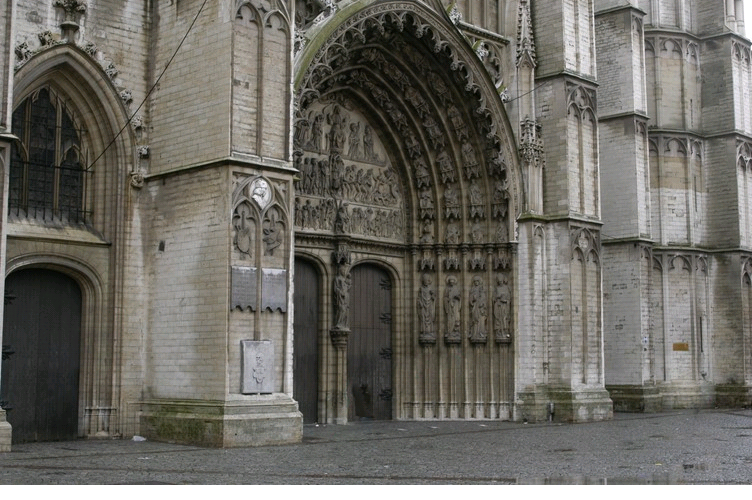

In [7]:
rgb_result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB) # type: ignore
show_image(rgb_result, title="result")

Wszystkie obrazy są tej samej wielkości oraz są odpowiednio wykadrowane, więc w rezultacie wszystkie zdjęcia różnią się jedynie ruchami osób.

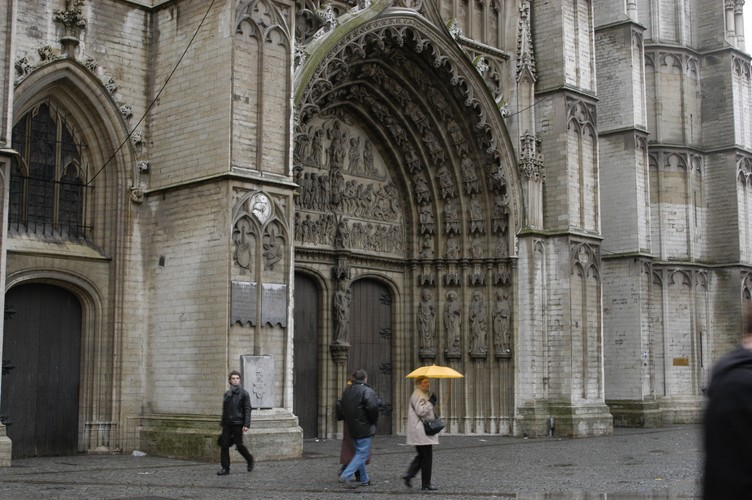

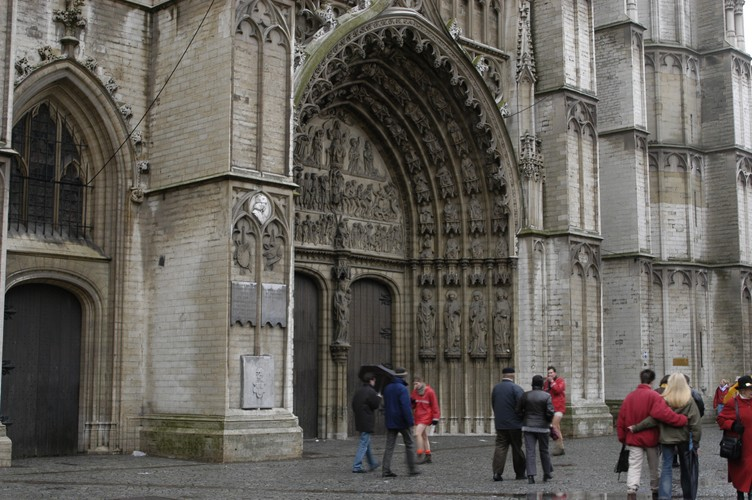

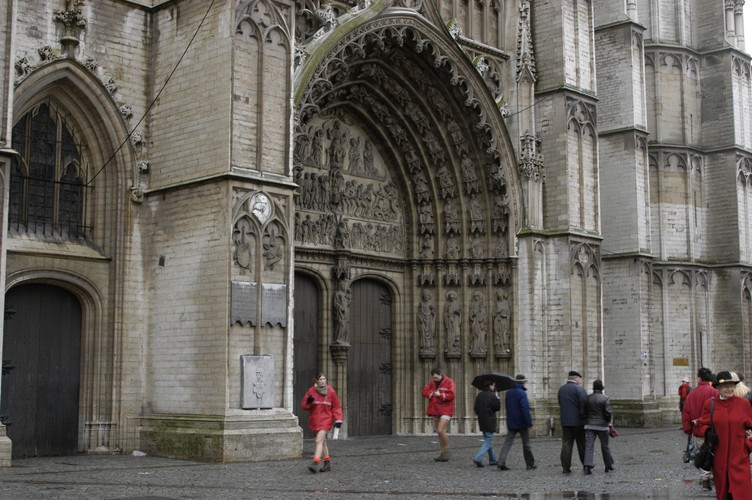

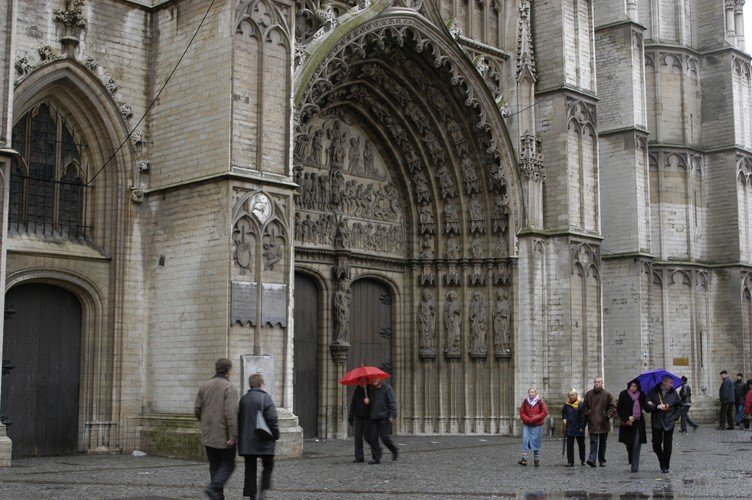

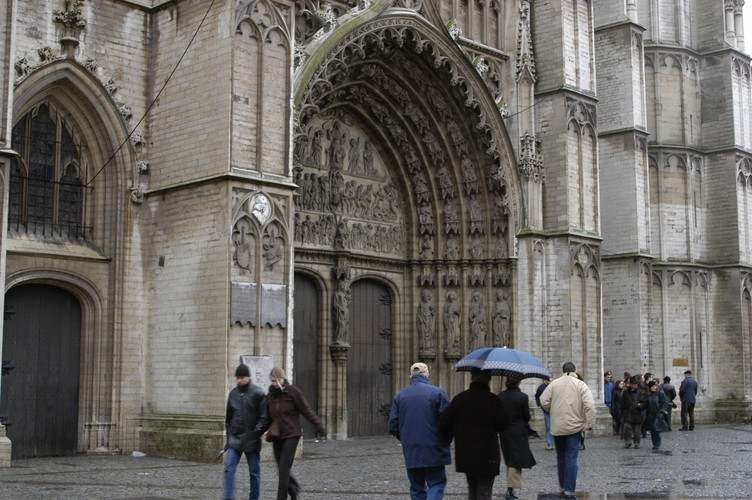

In [8]:
show_images(images_rgb, titles=titles)

### Opis algorytmu

##### Etap pierwszy

Etap pierwszy ma na celu wyróżnienie sylwetek ludzi z obrazów, a właściwie przygotowanie początkowego rezultatu, który ma już piksele powtarzające się na większości obrazów.

Przed pierwszym etapem wykonujemy preprocessing - median blur z oknem 3x3, by zmniejszyć różnice między pikselami w otoczeniu każdego piksela.

Porównujemy obraz pierwszy z pozostałymi rozważając okna (5x5) wokół każdego piksela. Jeśli dla n-1 z n pozostałych obrazów średnia różnic odpowiadających sobie punktów (wartości grayscale) w oknie jest mniesza niż pewien próg threshold (50).

Preprocessing jak i okno 5x5 mają na celu zmniejszenie średnio względnego progu na obrazie, przy którym piksele (otoczenia pikseli) są nierozróżnialne między obrazami. Porównywanie jedynie po 1 pikselu przy przesuniętych obrazach, czy jakimś szumie nie była by wystarczająco miarodajna, różnice były by większe, mnieszy obszar początkowy.

##### Etap drugi

Etap drugi ma na celu rozpropagowanie początkowego obrazu do "dziur" (fragmentów obrazu dla których jeszcze nie jest przypisana wartość). 

Dla każdego piksela szukamy w oknie 60x60 piksela, który ma najmniejszą różnicę (suma różnic na kanałach r, g, b) z pikselami w obrazach w środku tego okna. Jeśli ta różnica jest mniejsza od progu $z$ to przypisujemy wartość piksela z odpowiadającego obrazu do ostatecznego rezultatu. Próg $z$ zwiększa się co iterację w następujący sposób: $z = z + \lfloor \frac{z}{10} \rfloor
^2 + 1$. W końcu po jakimś czasie brakuje punktów spełniających warunek progu nawet przy nowych rozpropagowanych pikseli.

Kończymy, gdy cały obraz zostanie wypełniony. Oczywiście co iterację obszar ukończony na obrazie początkowym się powiększał (więc w sumie już nie początkowy).

Przy prototypowaniu (pierwszy pomysł) wykorzystano funkcję scipy distance_transform_edt, by zamiast szukać minimum w sporym oknie porównywano piksele na obrazach z najbliższym pikselem na początkowym rozwiązaniu do aktualnego punktu. Rozwiązanie praktycznie identycznej jakości co aktualne, jednak mieliśmy sami implementować funkcje, a samodzielna implementacja w numpy (prawie brute force) była kilkaset razy wolniesza więc zrezygnowano z tego rozwiązania.



###

In [9]:

# # pierwsza opcja wykonana przy pomocy scipy - jednak mieliśmy to zrobić bez zewnętrznych bibliotek, własne funkcje o tej samej funkcjonalności o wiele wolniejsze

# from scipy.ndimage import distance_transform_edt

# # 1. wypełnij w iteracji nieskończone piksele wartościami najbliższych skończonych pilseli
# # 2. jeśli minimalna różnica między ostatecznym obrazem a obrazem składowym jest mniejsza niż z przypisz piksel z obrazu składowego wBGR
# # zwiększaj z co iterację

# def propagate_final_bgr_scipy(images, final_bgr, finished):
#     final_bgr = final_bgr.copy()
#     z = 0 
#     while np.sum(finished == 0) > 0:
#         print(np.sum(finished == 0))
        
#         mask = (finished == 0)  # piksele, które trzeba uzupełnić

#         # oblicz odległość do najbliższego skończonego piksela
#         _, (y_indices, x_indices) = distance_transform_edt(mask, return_indices=True)

#         # dla wszystkich "dziur" – kopiujemy wartości BGR z najbliższych gotowych punktów
#         filled_final_bgr = final_bgr.copy()
#         filled_final_bgr[mask] = final_bgr[y_indices[mask], x_indices[mask]]
#         diffs = []
#         for i, img in enumerate(images):
#             diff = np.sum(cv2.absdiff(filled_final_bgr, img), axis=2)
#             diffs.append(diff)
#         args_min_diff = np.argmin(diffs, axis=0)

#         h, w = final_bgr.shape[:2]

#         # jeśli pixel nie finished i minimalnh diff jest mnijeszy niż próg z to wpisz pixel z obrazu z min diff
#         for y in range(h):
#             for x in range(w):
#                 if finished[y, x] == 0 and diffs[args_min_diff[y, x]][y, x] < z:
#                     src_img_idx = args_min_diff[y, x]
#                     final_bgr[y, x] = images[src_img_idx][y, x]
#                     finished[y, x] = 1

#         z += ((z//10) ** 2 + 1)
#         print(z)

#     return final_bgr

In [10]:
iteration_bgr = []
iterations_to_visualize = [1, 4, 8]
images_first_stage = images_grayscale.copy()
# images_first_stage = images_first_stage[:4,:,:] # bez 4 działa lepiej bo dziwne rzeczy wychodzą nawet z przesunięciem
# print(images_first_stage.shape)

images_first_stage = np.asarray([cv2.medianBlur(image, 3) for image in images_first_stage])
final_bgr = np.zeros_like(images[0])
finished = np.zeros_like(images_grayscale[0])

# porównuj obraz 0 z pozostałymi i zwracaj dla każdego piksela wektor True/False czy suma różnic pikseli w oknie 5x5 poniżej threshold (w grayscale)
where_cathedral = []
img = images_first_stage[0]
for j, img2 in enumerate(images_first_stage[1:]):
    wc = find_cathedral_windowed([img, img2], threshold = 50, window_size=5)
    where_cathedral.append(wc)

# jak dla co najmniej 3 obrazów z 4 suma jest mniejsza to znaczy że obrazy są podobne w tych miejscach - jako ostateczny obraz w tych miejscach przypisz obraz 0 w BGR

where_cathedral = np.sum(where_cathedral, axis=0) > len(images_first_stage) - 3
final_bgr[(where_cathedral > 0) & (finished == 0)] = images[0][(where_cathedral > 0) & (finished == 0)]

finished[(where_cathedral > 0) & (finished == 0)] = 1
first_stage_bgr = final_bgr.copy()

final_bgr = propagate_final_bgr_best_fit(images, final_bgr, finished)
# final_bgr = propagate_final_bgr_scipy(images, final_bgr, finished)
    
# final_rgb = cv2.cvtColor(final_bgr, cv2.COLOR_BGR2RGB)

# show_image(final_rgb, "final_image")


### Wizualizacja kolejnych kroków algorytmu

#### Pierwszy etap

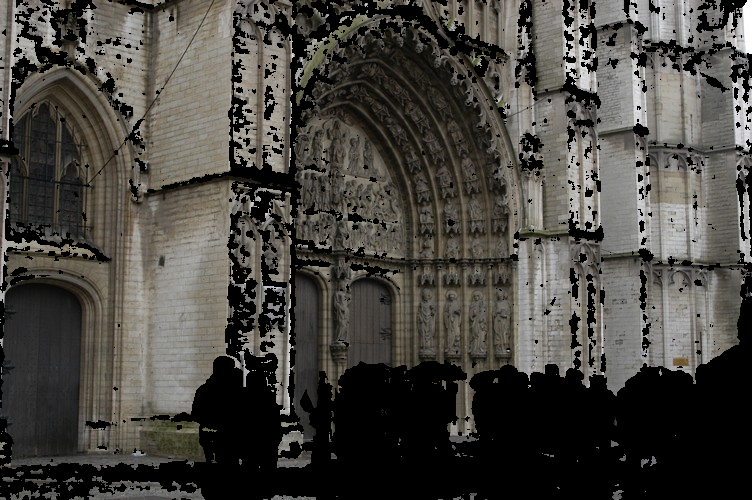

In [11]:
first_stage_rgb = cv2.cvtColor(first_stage_bgr, cv2.COLOR_BGR2RGB)
show_image(first_stage_rgb, "First stage result")

#### Iteracje drugiego etapu

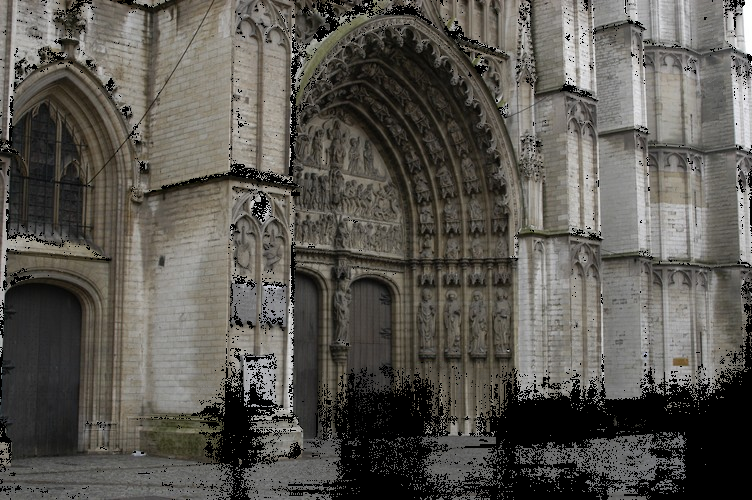

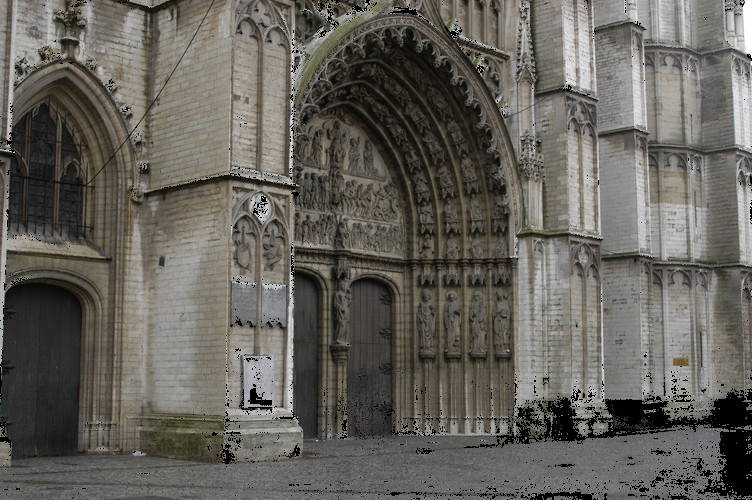

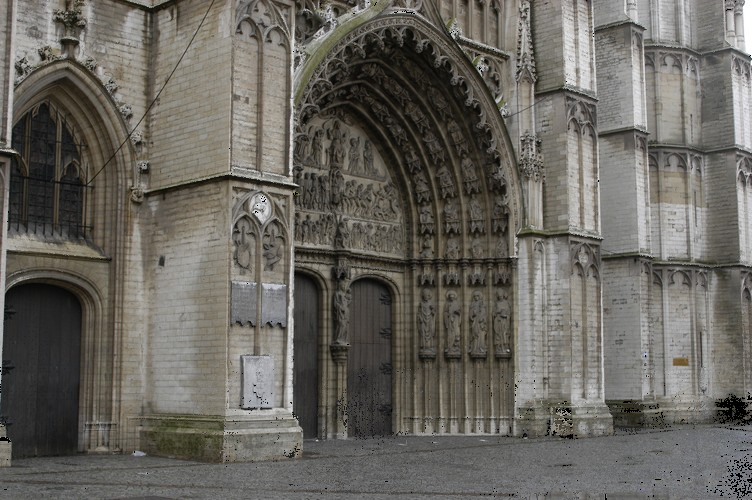

In [12]:
iterations_rgb = [cv2.cvtColor(iteration, cv2.COLOR_BGR2RGB) for iteration in iteration_bgr]
for i, iteration in enumerate(iterations_rgb):
    show_image(iteration, f"Iteration {iterations_to_visualize[i]}")

### Finalny rezultat - porównanie z referencyjnym

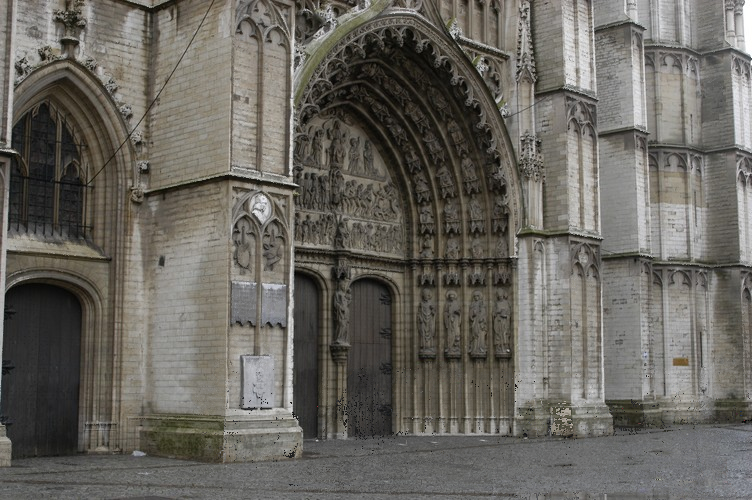

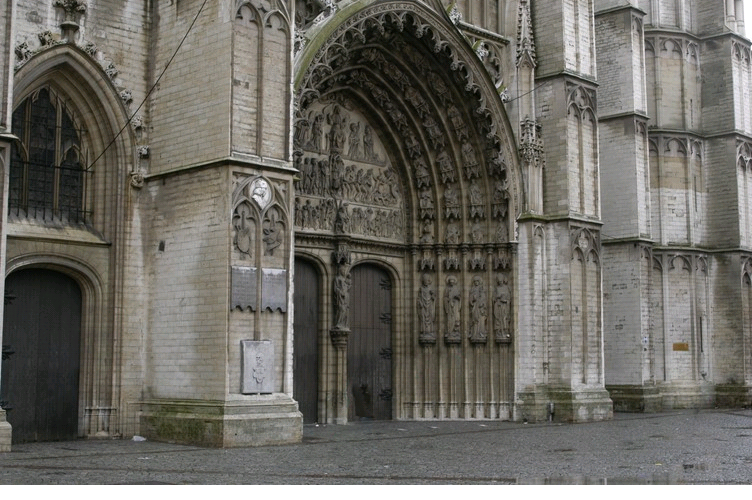

In [13]:
final_rgb = cv2.cvtColor(final_bgr, cv2.COLOR_BGR2RGB)
show_image(final_rgb, "Final image")
ref_img = cv2.imread("cathedral/result.png", cv2.IMREAD_COLOR)
ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
show_image(ref_img, "Reference image")

### Wnioski

##### Algorytm

W oknie 60x60 jest wiele różnych pikseli i bierzemy pod uwagę najlepszy. Algorytm wykorzystujący najbliższe (dystans euklidesowy) jest bardziej sensowny, gdyż chcemy propagować wartości z jak najbliższego otoczenia (niestety samodzielna implementacja w numpy podobnego algorytmu była kilkaset razy wolniejsza). Tak dobry rezultat jak przy najbliższych pikselach algorytm osiąga przy odpowiednio dobranym oknie - nie za małym i nie za dużym.

Problematyczny jest obraz d005.jpg który wydaje się przesunięty prównując do pozostałych obrazów, co sprawia, że otrzymujemy mniejszy obszar po pierwszym etapie niż bez niego (bez niego przy krawędziach katedry - łuki i rogi budynku są już w początkowym obrazie po pierwszym etapie; praktycznie tylko okolice sylwetek ludzi nie mają przypisanej wartości - są czarne), jednak nie wpływa to znacząco na wynik ostateczny. Próby przesunięcia obrazu w stosunku do pozostałych dodatkowym algorytmem nie dały zadowalających rezultatów.

##### Wizualizacja

Pierwszy etap pozwala na wyodrębnienie ludzi z obrazu i ukończenie początkowego wyniku. Jak widać spora część obrazu, która się powtarza na obrazach jest już widoczna.

Podczas itercji drugiego etapu, który propaguje już ukończony obraz do wewnątrz nieukończonych "dziur". 

Chodnik szybko został skończony podczas drugiego etapu, ponieważ jest w miarę jednorodnego koloru. Z kolei ciemny punkt na ścianie katedry uzupełniony został na samym końcu, gdyż w jego sąsiedztewie nie było podobnych dużo kolorów - różnica za mała by zmieścić się w progu z.

Ostateczny rezultat jest zadowalający. Pozbyliśmy się ludzi z obrazu. Widać artefakty na obrazie, jednak na obrazie referencyjnym też są one widoczne, np. na głównych drzwiach czarna kurtka.